#                                         P383-Telecom-Churn

# Problem Statement

1.Customer churn is a big problem for telecommunications companies. Indeed, their annual churn rates are usually higher than 10%. 

2.For that reason, they develop strategies to keep as many clients as possible.

3.This is a classification project since the variable to be predicted is binary (churn or loyal customer).

4.The goal here is to model churn probability, conditioned on the customer features.

In [1]:
# Import Libraries

import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, roc_auc_score

import warnings
warnings.filterwarnings('ignore')


# Load Dataset


In [2]:
Telecom_churn_data = pd.read_csv("Churn (1).csv")

# Statistical Analysis

In [3]:
Telecom_churn_data.head(5)

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [4]:
# Rename columns 

new_column_names = {
    'area.code' : 'area_code',
    'account.length': 'account_length',
    'voice.plan': 'voice_plan',
     'voice.messages': 'voice_messages',
     'intl.plan': 'intl_plan',
     'intl.mins': 'intl_mins',
     'intl.calls': 'intl_calls',
     'intl.charge': 'intl_charge',
     'day.mins': 'day_mins',
     'day.calls': 'day_calls',
     'day.charge': 'day_charge',
     'eve.mins': 'eve_mins',
     'eve.calls': 'eve_calls',
     'eve.charge': 'eve_charge',
     'night.mins': 'night_mins',
     'night.calls': 'night_calls',
     'night.charge': 'night_charge',
     'customer.calls': 'customer_calls'
}


Telecom_churn_data = Telecom_churn_data.rename(columns= new_column_names)

In [5]:
Telecom_churn_data.dtypes

Unnamed: 0          int64
state              object
area_code          object
account_length      int64
voice_plan         object
voice_messages      int64
intl_plan          object
intl_mins         float64
intl_calls          int64
intl_charge       float64
day_mins          float64
day_calls           int64
day_charge         object
eve_mins           object
eve_calls           int64
eve_charge        float64
night_mins        float64
night_calls         int64
night_charge      float64
customer_calls      int64
churn              object
dtype: object

In [6]:
Telecom_churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area_code       5000 non-null   object 
 3   account_length  5000 non-null   int64  
 4   voice_plan      5000 non-null   object 
 5   voice_messages  5000 non-null   int64  
 6   intl_plan       5000 non-null   object 
 7   intl_mins       5000 non-null   float64
 8   intl_calls      5000 non-null   int64  
 9   intl_charge     5000 non-null   float64
 10  day_mins        5000 non-null   float64
 11  day_calls       5000 non-null   int64  
 12  day_charge      5000 non-null   object 
 13  eve_mins        5000 non-null   object 
 14  eve_calls       5000 non-null   int64  
 15  eve_charge      5000 non-null   float64
 16  night_mins      5000 non-null   float64
 17  night_calls     5000 non-null   i

1.when we observe "day_charge" and "eve_mins" columns. Both columns have numerical data but We observe in
 Telecom_churn_data.info()  Data Types are object
 
2.So, we need to convert them into Float Data types

In [7]:

columns_to_convert = ['day_charge', 'eve_mins']

Telecom_churn_data[columns_to_convert] = Telecom_churn_data[columns_to_convert].apply(pd.to_numeric, errors='coerce')


In [8]:
Telecom_churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area_code       5000 non-null   object 
 3   account_length  5000 non-null   int64  
 4   voice_plan      5000 non-null   object 
 5   voice_messages  5000 non-null   int64  
 6   intl_plan       5000 non-null   object 
 7   intl_mins       5000 non-null   float64
 8   intl_calls      5000 non-null   int64  
 9   intl_charge     5000 non-null   float64
 10  day_mins        5000 non-null   float64
 11  day_calls       5000 non-null   int64  
 12  day_charge      4993 non-null   float64
 13  eve_mins        4976 non-null   float64
 14  eve_calls       5000 non-null   int64  
 15  eve_charge      5000 non-null   float64
 16  night_mins      5000 non-null   float64
 17  night_calls     5000 non-null   i

In [9]:
Telecom_churn_data.shape

(5000, 21)

In [10]:
Telecom_churn_data.columns

Index(['Unnamed: 0', 'state', 'area_code', 'account_length', 'voice_plan',
       'voice_messages', 'intl_plan', 'intl_mins', 'intl_calls', 'intl_charge',
       'day_mins', 'day_calls', 'day_charge', 'eve_mins', 'eve_calls',
       'eve_charge', 'night_mins', 'night_calls', 'night_charge',
       'customer_calls', 'churn'],
      dtype='object')

In [11]:
# Here 'Unnamed: 0' is index column so, drop 'Unnamed: 0' column 
Telecom_churn_data = Telecom_churn_data.drop(columns = 'Unnamed: 0')

In [12]:
Telecom_churn_data.describe()

,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls
count,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,4993.000000,4976.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,100.25860,7.755200,10.261780,4.435200,2.771196,180.288900,100.029400,30.653501,200.580326,100.191000,17.054322,200.391620,99.919200,9.017732,1.570400
std,39.69456,13.546393,2.761396,2.456788,0.745514,53.894699,19.831197,9.166356,50.554637,19.826496,4.296843,50.527789,19.958686,2.273763,1.306363
min,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.00000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,24.430000,166.275000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000
50%,100.00000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,127.00000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,243.00000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


In [13]:
Telecom_churn_data.head(2)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.7,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,OH,area_code_415,107,yes,26,no,13.7,3,3.7,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no


In [14]:
Telecom_churn_data.isna().sum()

state              0
area_code          0
account_length     0
voice_plan         0
voice_messages     0
intl_plan          0
intl_mins          0
intl_calls         0
intl_charge        0
day_mins           0
day_calls          0
day_charge         7
eve_mins          24
eve_calls          0
eve_charge         0
night_mins         0
night_calls        0
night_charge       0
customer_calls     0
churn              0
dtype: int64

We can observe day_charge and eve_mins columns we have null values

In [15]:
# Impute null values with median
Telecom_churn_data.fillna(Telecom_churn_data.median(), inplace=True)


In [16]:
Telecom_churn_data.isna().sum()

state             0
area_code         0
account_length    0
voice_plan        0
voice_messages    0
intl_plan         0
intl_mins         0
intl_calls        0
intl_charge       0
day_mins          0
day_calls         0
day_charge        0
eve_mins          0
eve_calls         0
eve_charge        0
night_mins        0
night_calls       0
night_charge      0
customer_calls    0
churn             0
dtype: int64

In [17]:
# checking weather is having duplicates or not

Telecom_churn_data[Telecom_churn_data.duplicated()]


,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn


In [18]:
# checking Unique Values
Telecom_churn_data['state'].unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI',
       'IA', 'MT', 'NY', 'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC',
       'NE', 'WY', 'HI', 'IL', 'NH', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR',
       'MI', 'DE', 'UT', 'CA', 'MN', 'SD', 'NC', 'WA', 'NM', 'NV', 'DC',
       'KY', 'ME', 'MS', 'TN', 'PA', 'CT', 'ND'], dtype=object)

In [19]:
# checking Unique Values
Telecom_churn_data['area_code'].unique()

array(['area_code_415', 'area_code_408', 'area_code_510'], dtype=object)

In [20]:
# checking Unique Values
Telecom_churn_data['intl_plan'].unique()

array(['no', 'yes'], dtype=object)

In [21]:
# checking Unique Values
Telecom_churn_data['intl_plan'].unique()

array(['no', 'yes'], dtype=object)

In [22]:
Telecom_churn_data.head(2)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.7,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,OH,area_code_415,107,yes,26,no,13.7,3,3.7,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no


In [23]:
# checking Unique Values
Telecom_churn_data['voice_plan'].unique()

array(['yes', 'no'], dtype=object)

In [24]:
# checking Unique Values
Telecom_churn_data['customer_calls'].unique()

array([1, 0, 2, 3, 4, 5, 7, 9, 6, 8], dtype=int64)

In [25]:
# checking Unique Values
Telecom_churn_data['churn'].unique()

array(['no', 'yes'], dtype=object)

In [26]:
# checking Unique Values
Telecom_churn_data['intl_plan'].unique()

array(['no', 'yes'], dtype=object)

In [27]:
Telecom_churn_data.corr()

,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls
account_length,1.000000,-0.014575,0.001291,0.014277,0.001292,-0.001017,0.028240,-0.000799,-0.008676,0.009143,-0.009587,0.000668,-0.007825,0.000656,-0.001445
voice_messages,-0.014575,1.000000,0.002463,0.000124,0.002505,0.005381,0.000883,0.005141,0.018869,-0.003954,0.019496,0.005541,0.002676,0.005535,-0.007086
intl_mins,0.001291,0.002463,1.000000,0.016791,0.999993,-0.019486,0.013097,-0.019282,-0.000356,-0.007458,0.000132,-0.006721,0.000391,-0.006717,-0.012122
intl_calls,0.014277,0.000124,0.016791,1.000000,0.016900,-0.001303,0.010893,-0.001597,0.007997,0.005574,0.008393,-0.017214,-0.000156,-0.017182,-0.019147
intl_charge,0.001292,0.002505,0.999993,0.016900,1.000000,-0.019415,0.013161,-0.019212,-0.000333,-0.007507,0.000155,-0.006655,0.000368,-0.006650,-0.012180
day_mins,-0.001017,0.005381,-0.019486,-0.001303,-0.019415,1.000000,0.001935,0.999769,-0.010906,0.008128,-0.010760,0.011799,0.004236,0.011783,0.002733
day_calls,0.028240,0.000883,0.013097,0.010893,0.013161,0.001935,1.000000,0.001666,-0.001719,0.003754,-0.000695,0.002804,-0.008308,0.002802,-0.010739
day_charge,-0.000799,0.005141,-0.019282,-0.001597,-0.019212,0.999769,0.001666,1.000000,-0.011530,0.007983,-0.011383,0.011317,0.004207,0.011301,0.002930
eve_mins,-0.008676,0.018869,-0.000356,0.007997,-0.000333,-0.010906,-0.001719,-0.011530,1.000000,0.003119,0.997671,-0.016503,0.015578,-0.016504,-0.012401
eve_calls,0.009143,-0.003954,-0.007458,0.005574,-0.007507,0.008128,0.003754,0.007983,0.003119,1.000000,0.002778,0.001781,-0.013682,0.001799,0.006235


# Exploratory Data Analysis

<AxesSubplot:title={'center':'Distribution of the churn columns'}, ylabel='churn'>

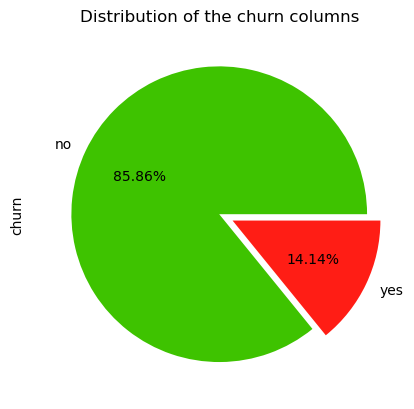

In [28]:
plt.title('Distribution of the churn columns')
explode = (0, 0.1)
Telecom_churn_data['churn'].value_counts().plot(kind='pie', autopct = '%.2f%%',
            explode = explode, colors=['#3ec300', '#ff1d15'])

<AxesSubplot:title={'center':'Distribution of the churn columns'}, ylabel='voice_plan'>

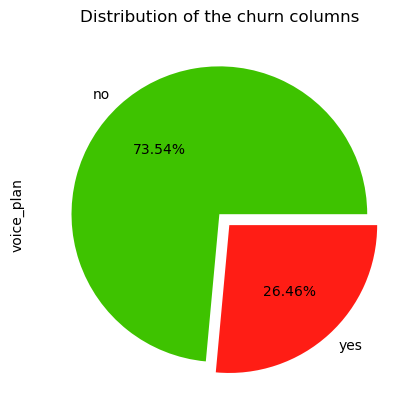

In [29]:
plt.title('Distribution of the churn columns')
explode = (0, 0.1)
Telecom_churn_data['voice_plan'].value_counts().plot(kind='pie', autopct = '%.2f%%',
            explode = explode, colors=['#3ec300', '#ff1d15'])

<AxesSubplot:title={'center':'Distribution of the churn columns'}, ylabel='intl_plan'>

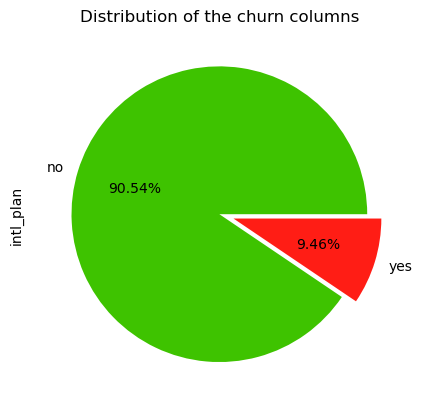

In [30]:
plt.title('Distribution of the churn columns')
explode = (0, 0.1)
Telecom_churn_data['intl_plan'].value_counts().plot(kind='pie', autopct = '%.2f%%',
            explode = explode, colors=['#3ec300', '#ff1d15'])

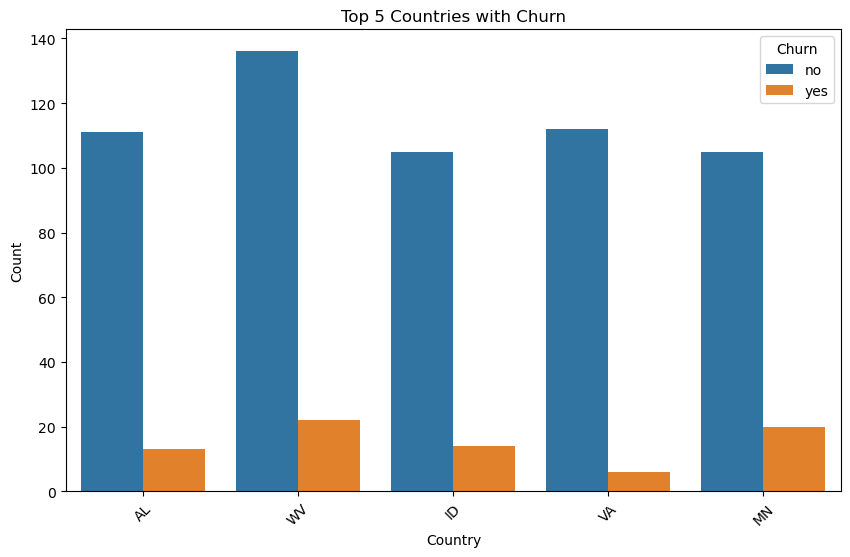

In [31]:


top_5_countries = Telecom_churn_data['state'].value_counts().head(5).index
ch_top_5 = Telecom_churn_data[Telecom_churn_data['state'].isin(top_5_countries)]

# Create count plot
plt.figure(figsize=(10, 6))
sns.countplot(data=ch_top_5, x='state', hue='churn')
plt.title('Top 5 Countries with Churn')
plt.xlabel('Country')
plt.ylabel('Count')
plt.legend(title='Churn', loc='upper right')
plt.xticks(rotation=45)
plt.show()


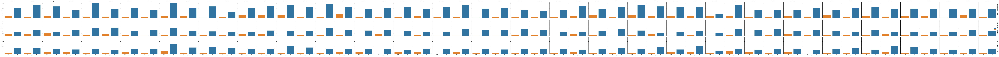

In [32]:

# Select top 5 area codes based on churn count
top_5_area_codes = Telecom_churn_data['area_code'].value_counts().head(5).index

# Filter DataFrame for top 5 area codes
ch_top_5_area_codes = Telecom_churn_data[Telecom_churn_data['area_code'].isin(top_5_area_codes)]

# Create FacetGrid
g = sns.FacetGrid(ch_top_5_area_codes, row='area_code', col='state', hue='churn', margin_titles=True)
g.map(sns.countplot, 'churn', order=['yes', 'no'])

# Adjust plot aesthetics
g.set_axis_labels('Churn', 'Count')
g.set_titles(row_template='Area Code: {row_name}', col_template='State: {col_name}')
g.add_legend(title='Churn')
plt.tight_layout()
plt.show()


Observation 

1. In first Row we can Observe Count of churn in all the States with in area_code_415 pincode

2. In Second Row we can Observe Count of churn in all the States with in area_code_408 pincode

3. In Third Row we can Observe Count of churn in all the States with in area_code_510 pincode

In [33]:

# Define the list of categorical columns
categorical_columns = ['state', 'area_code', 'voice_plan', 'intl_plan', 'churn']

# Assuming Telecom_churn_data is your DataFrame
Telecom_churn_data1 = Telecom_churn_data.copy()

# Instantiate LabelEncoder
label_encoder = LabelEncoder()

# Encode categorical columns to numerical values
for col in categorical_columns:
    Telecom_churn_data1[col] = label_encoder.fit_transform(Telecom_churn_data1[col])

# Display the modified DataFrame
print(Telecom_churn_data1)


      state  area_code  account_length  voice_plan  voice_messages  intl_plan  \
0        16          1             128           1              25          0   
1        35          1             107           1              26          0   
2        31          1             137           0               0          0   
3        35          0              84           0               0          1   
4        36          1              75           0               0          1   
...     ...        ...             ...         ...             ...        ...   
4995     11          0              50           1              40          0   
4996     49          1             152           0               0          0   
4997      7          1              61           0               0          0   
4998      7          2             109           0               0          0   
4999     46          1              86           1              34          0   

      intl_mins  intl_calls

In [34]:
Telecom_churn_data1.head(2)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,16,1,128,1,25,0,10.0,3,2.7,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,35,1,107,1,26,0,13.7,3,3.7,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0


<AxesSubplot:>

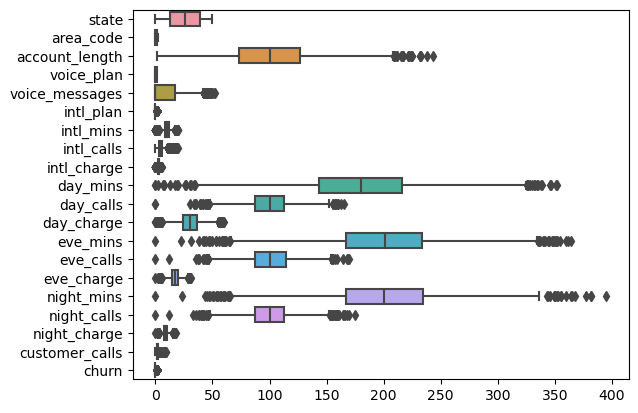

In [35]:
sns.boxplot(data=Telecom_churn_data1, orient='h')

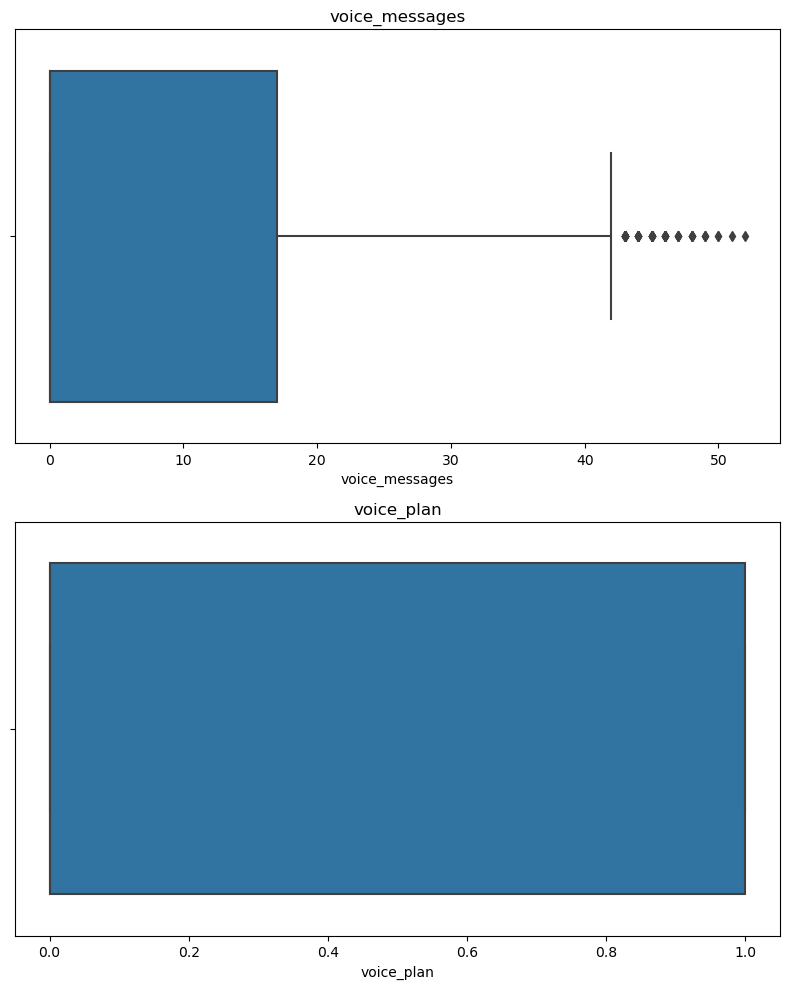

In [36]:
# Create a figure and axes
fig, axes = plt.subplots(2, 1, figsize=(8, 10))  # 2 rows, 1 column

# Plot the first box plot
sns.boxplot(x='voice_messages', data=Telecom_churn_data1, ax=axes[0])
axes[0].set_title('voice_messages')

# Plot the second box plot
sns.boxplot(x='voice_plan', data=Telecom_churn_data1, ax=axes[1])
axes[1].set_title('voice_plan')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

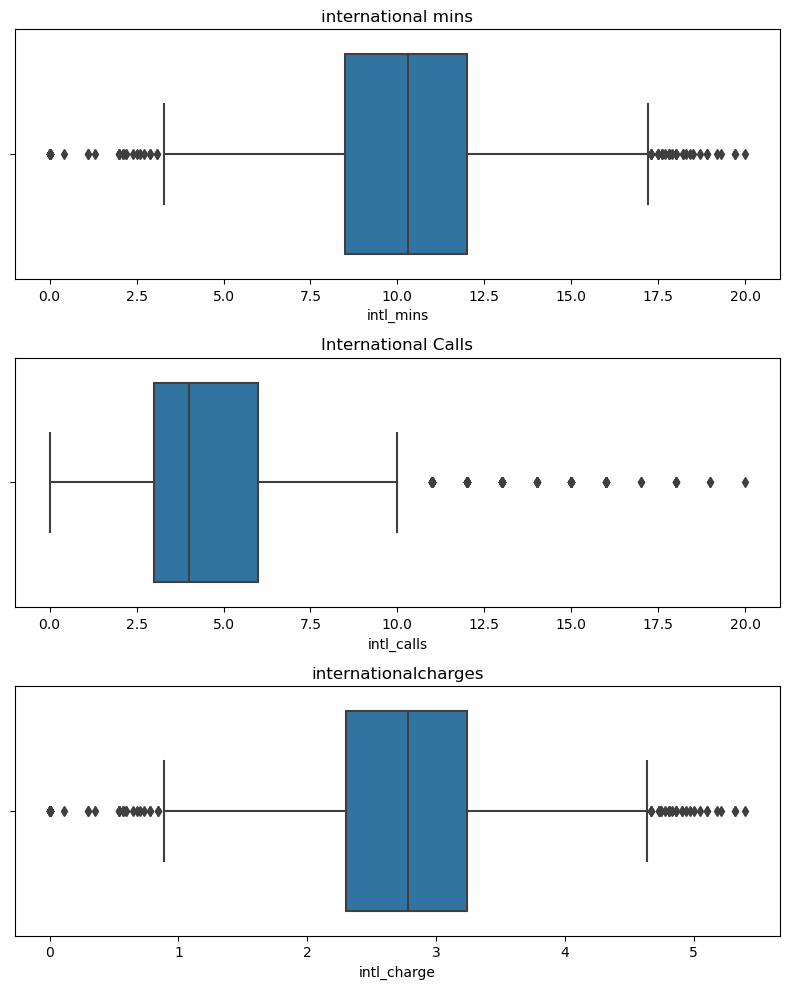

In [37]:
# Create a figure and axes
fig, axes = plt.subplots(3, 1, figsize=(8, 10))


sns.boxplot(x='intl_mins', data=Telecom_churn_data1, ax=axes[0])
axes[0].set_title('international mins')


sns.boxplot(x='intl_calls', data=Telecom_churn_data1, ax=axes[1])
axes[1].set_title('International Calls')


sns.boxplot(x='intl_charge', data=Telecom_churn_data1, ax=axes[2])
axes[2].set_title('internationalcharges')
# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

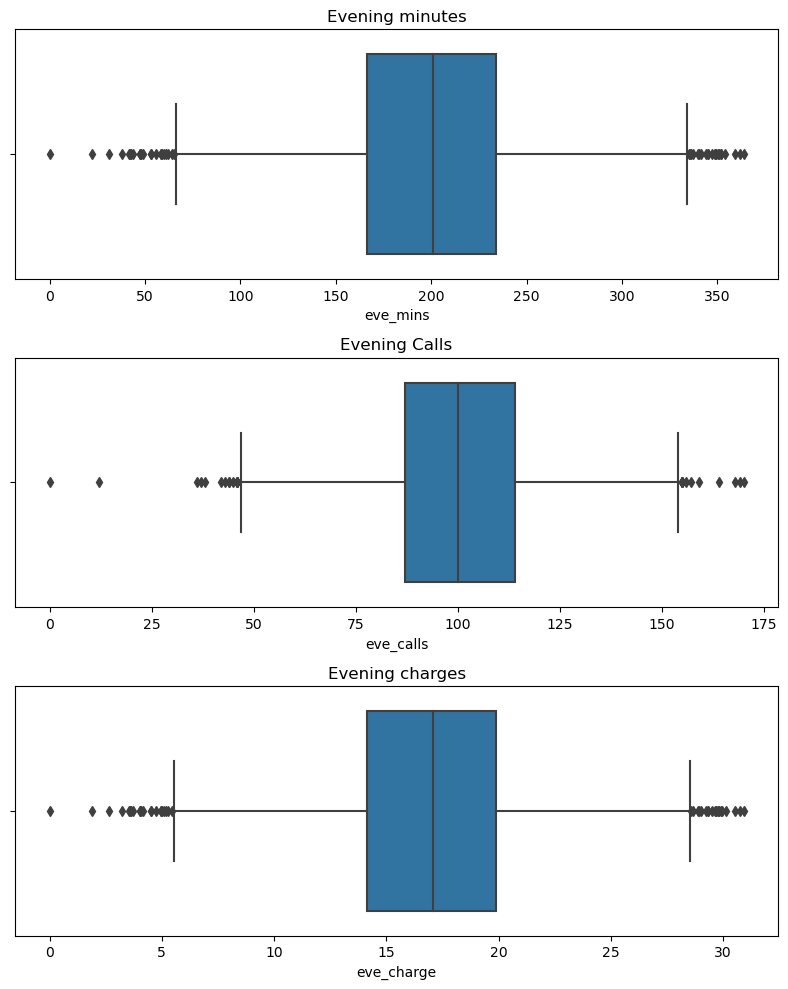

In [38]:
# Create a figure and axes
fig, axes = plt.subplots(3, 1, figsize=(8, 10))


sns.boxplot(x='eve_mins', data=Telecom_churn_data1, ax=axes[0])
axes[0].set_title('Evening minutes')


sns.boxplot(x='eve_calls', data=Telecom_churn_data1, ax=axes[1])
axes[1].set_title('Evening Calls')


sns.boxplot(x='eve_charge', data=Telecom_churn_data1, ax=axes[2])
axes[2].set_title('Evening charges')
# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

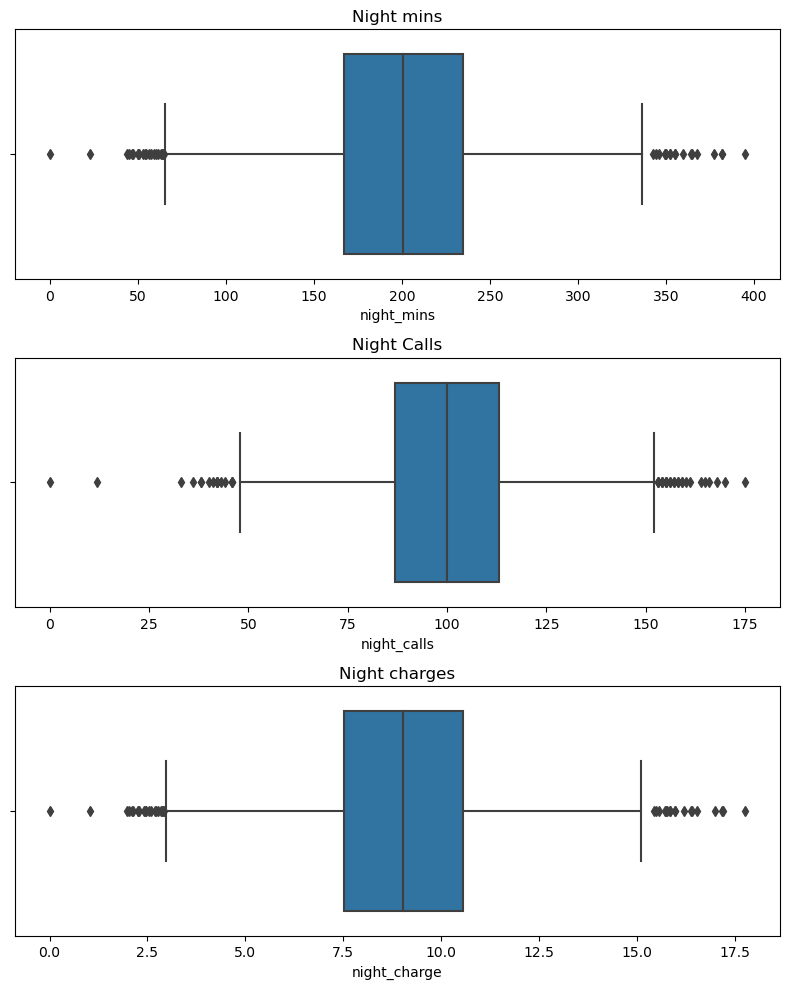

In [39]:
# Create a figure and axes
fig, axes = plt.subplots(3, 1, figsize=(8, 10))


sns.boxplot(x='night_mins', data=Telecom_churn_data1, ax=axes[0])
axes[0].set_title('Night mins')


sns.boxplot(x='night_calls', data=Telecom_churn_data1, ax=axes[1])
axes[1].set_title('Night Calls')


sns.boxplot(x='night_charge', data=Telecom_churn_data1, ax=axes[2])
axes[2].set_title('Night charges')
# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

# Checking Weather Data is following Normal Distribution or not

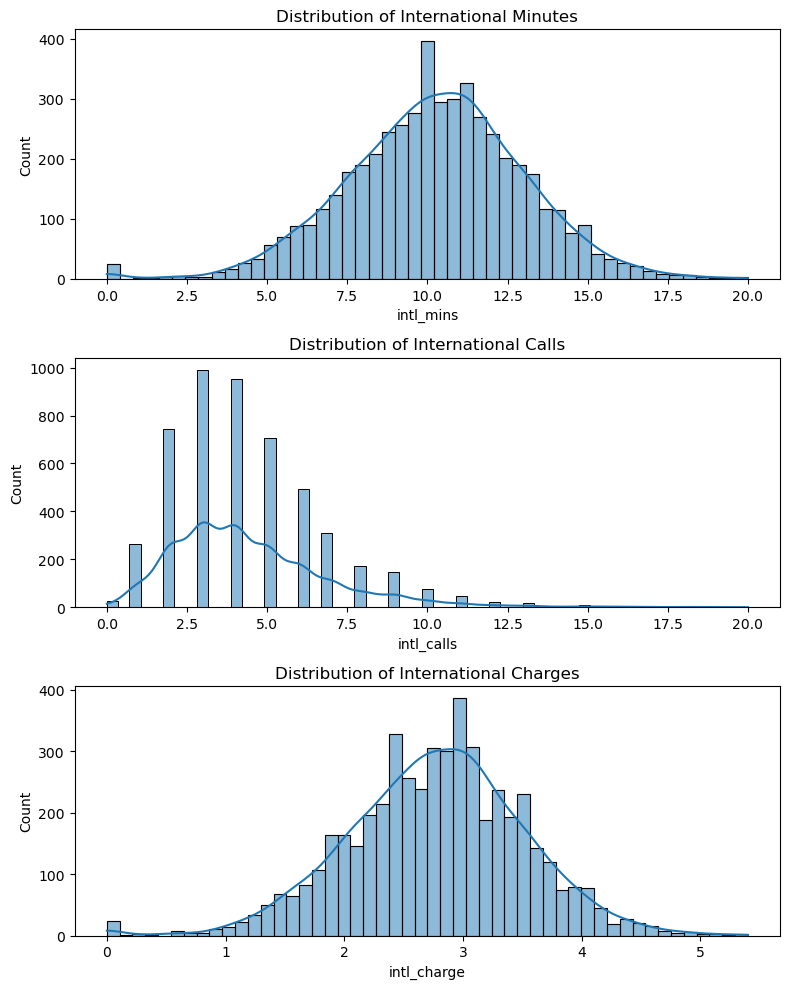

In [40]:

# Create a figure and axes
fig, axes = plt.subplots(3, 1, figsize=(8, 10))

# Plot distribution plot for 'intl_mins'
sns.histplot(Telecom_churn_data1['intl_mins'], kde=True, ax=axes[0])
axes[0].set_title('Distribution of International Minutes')

# Plot distribution plot for 'intl_calls'
sns.histplot(Telecom_churn_data1['intl_calls'], kde=True, ax=axes[1])
axes[1].set_title('Distribution of International Calls')

# Plot distribution plot for 'intl_charge'
sns.histplot(Telecom_churn_data1['intl_charge'], kde=True, ax=axes[2])
axes[2].set_title('Distribution of International Charges')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


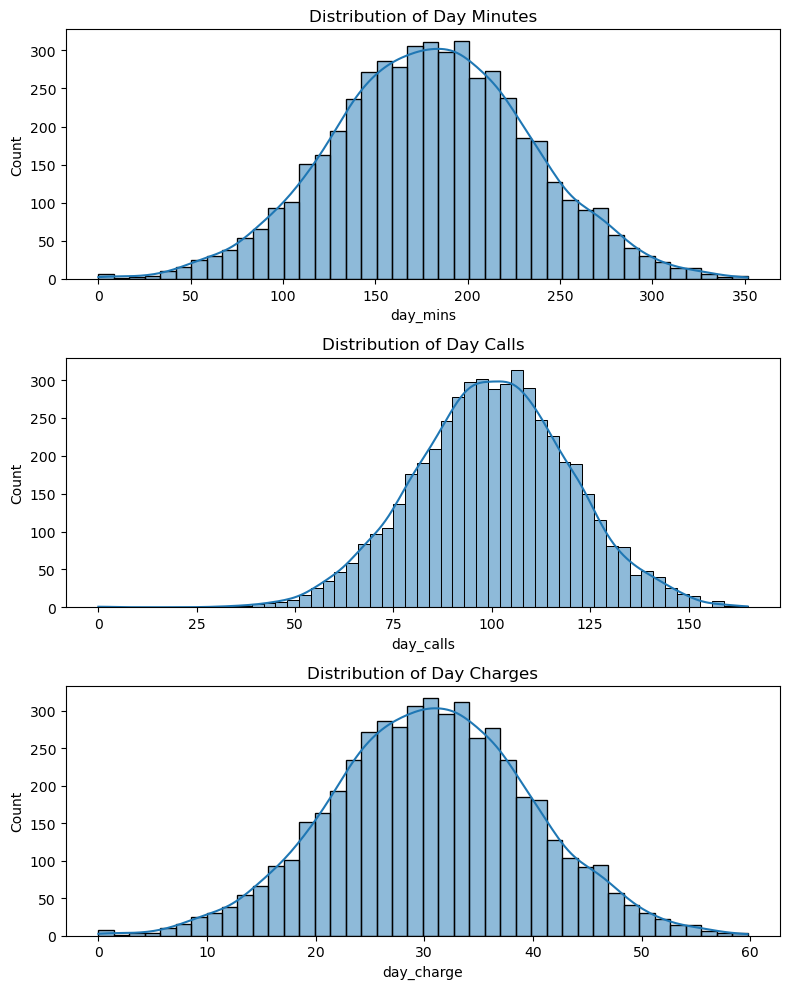

In [41]:

# Create a figure and axes
fig, axes = plt.subplots(3, 1, figsize=(8, 10))

# Plot distribution plot for 'day_mins'
sns.histplot(Telecom_churn_data1['day_mins'], kde=True, ax=axes[0])
axes[0].set_title('Distribution of Day Minutes')

# Plot distribution plot for 'day_calls'
sns.histplot(Telecom_churn_data1['day_calls'], kde=True, ax=axes[1])
axes[1].set_title('Distribution of Day Calls')

# Plot distribution plot for 'day_charge'
sns.histplot(Telecom_churn_data1['day_charge'], kde=True, ax=axes[2])
axes[2].set_title('Distribution of Day Charges')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


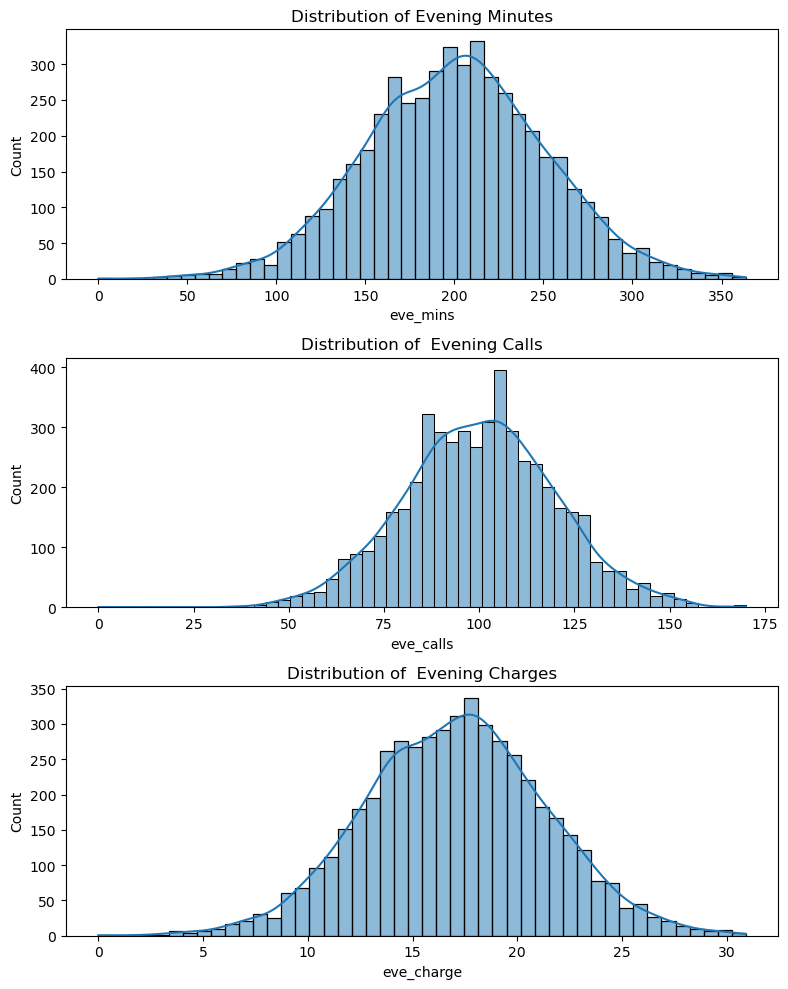

In [42]:

# Create a figure and axes
fig, axes = plt.subplots(3, 1, figsize=(8, 10))

# Plot distribution plot for 'eve_mins'
sns.histplot(Telecom_churn_data1['eve_mins'], kde=True, ax=axes[0])
axes[0].set_title('Distribution of Evening Minutes')

# Plot distribution plot for 'eve_calls'
sns.histplot(Telecom_churn_data1['eve_calls'], kde=True, ax=axes[1])
axes[1].set_title('Distribution of  Evening Calls')

# Plot distribution plot for 'eve_charge'
sns.histplot(Telecom_churn_data1['eve_charge'], kde=True, ax=axes[2])
axes[2].set_title('Distribution of  Evening Charges')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


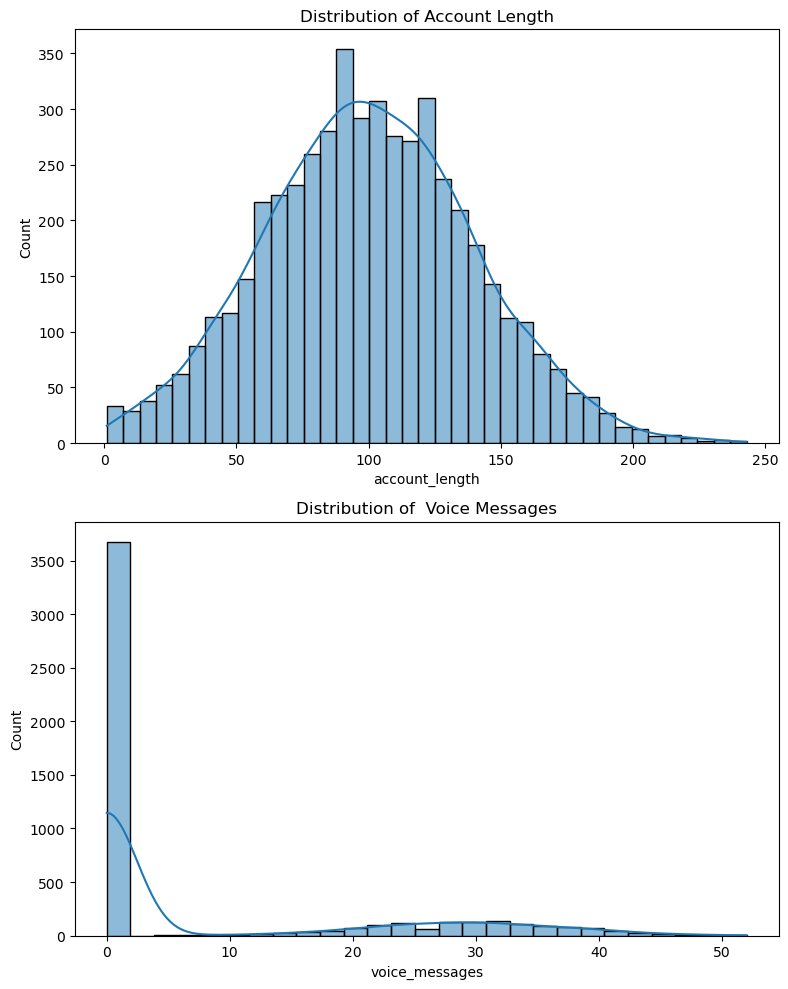

In [43]:

# Create a figure and axes
fig, axes = plt.subplots(2, 1, figsize=(8, 10))

# Plot distribution plot for 'account_length'
sns.histplot(Telecom_churn_data1['account_length'], kde=True, ax=axes[0])
axes[0].set_title('Distribution of Account Length')

# Plot distribution plot for 'Voice_mossages'
sns.histplot(Telecom_churn_data1['voice_messages'], kde=True, ax=axes[1])
axes[1].set_title('Distribution of  Voice Messages')



# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


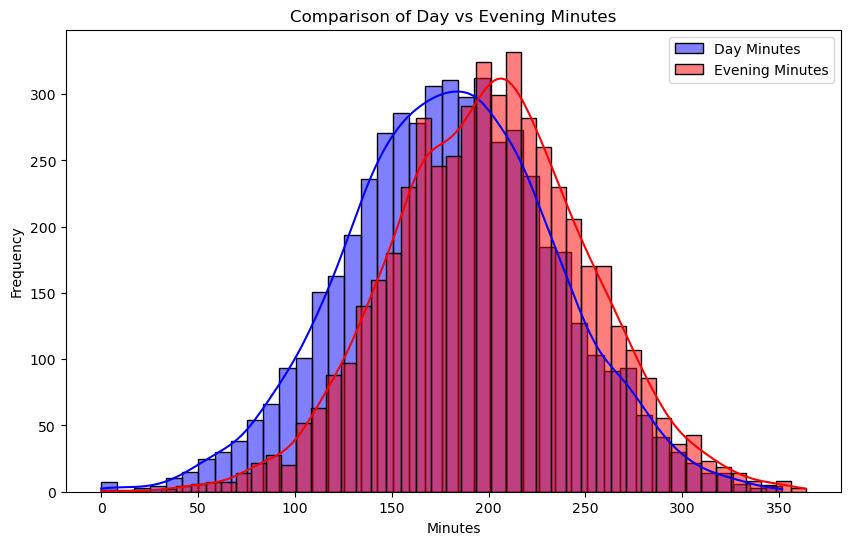

In [44]:

plt.figure(figsize=(10, 6))

# Plot histograms
sns.histplot(Telecom_churn_data1['day_mins'], color='blue', label='Day Minutes', kde=True)
sns.histplot(Telecom_churn_data1['eve_mins'], color='red', label='Evening Minutes', kde=True)

# Add legend and labels
plt.legend()
plt.xlabel('Minutes')
plt.ylabel('Frequency')
plt.title('Comparison of Day vs Evening Minutes')
plt.show()



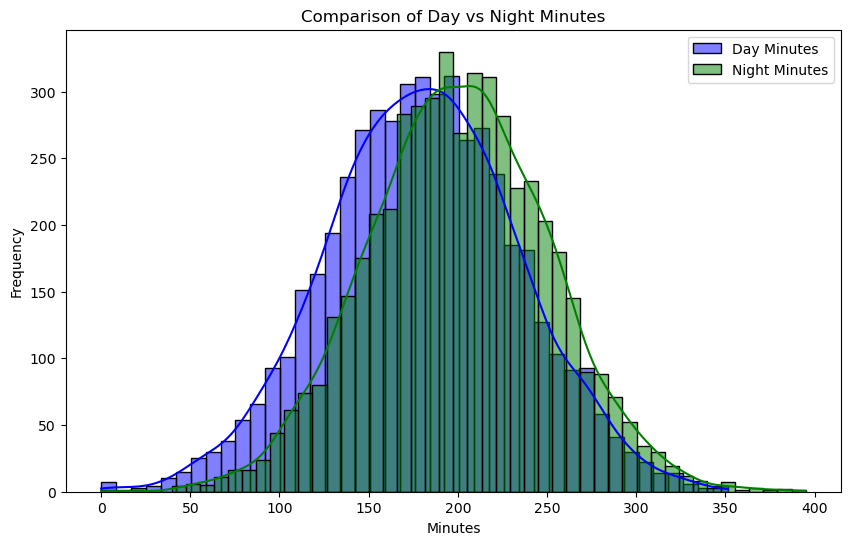

In [45]:
plt.figure(figsize=(10, 6))

# Plot histograms
sns.histplot(Telecom_churn_data1['day_mins'], color='blue', label='Day Minutes', kde=True)
sns.histplot(Telecom_churn_data1['night_mins'], color='green', label='Night Minutes', kde=True)

# Add legend and labels
plt.legend()
plt.xlabel('Minutes')
plt.ylabel('Frequency')
plt.title('Comparison of Day vs Night Minutes')
plt.show()


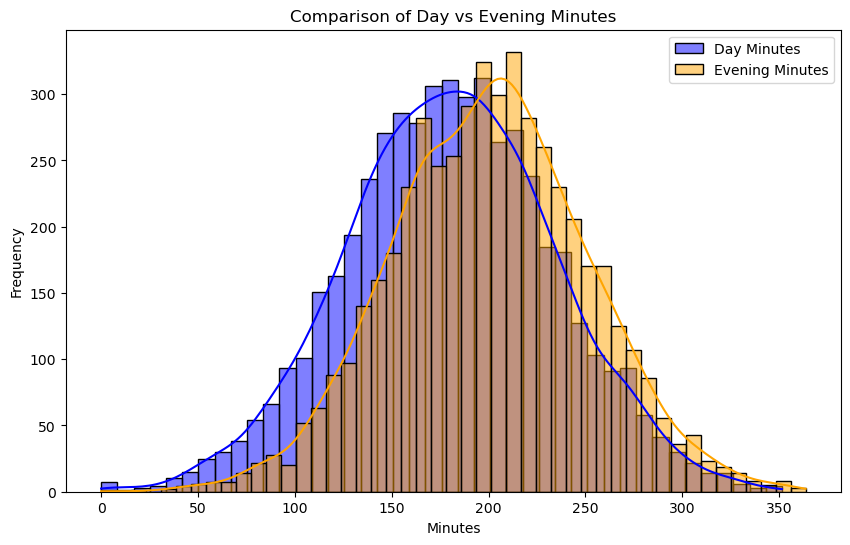

In [46]:
plt.figure(figsize=(10, 6))

# Plot histograms
sns.histplot(Telecom_churn_data1['day_mins'], color='blue', label='Day Minutes', kde=True)
sns.histplot(Telecom_churn_data1['eve_mins'], color='orange', label='Evening Minutes', kde=True)

# Add legend and labels
plt.legend()
plt.xlabel('Minutes')
plt.ylabel('Frequency')
plt.title('Comparison of Day vs Evening Minutes')
plt.show()


# Count Plot

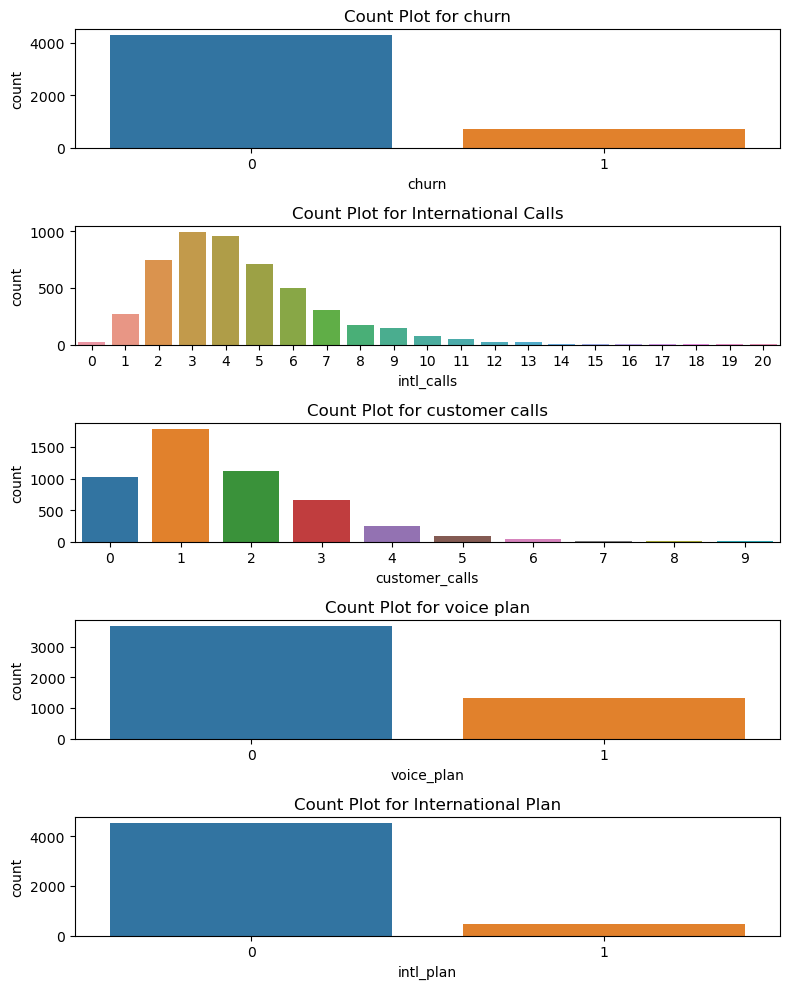

In [47]:

# Create a figure and axes
fig, axes = plt.subplots(5, 1, figsize=(8, 10))

# Plot count plot for 'churn'
sns.countplot(x='churn', data=Telecom_churn_data1, ax=axes[0])
axes[0].set_title('Count Plot for churn')

# Plot count plot for 'intl_calls'
sns.countplot(x='intl_calls', data=Telecom_churn_data1, ax=axes[1])
axes[1].set_title('Count Plot for International Calls')

# Plot count plot for 'customer_calls'
sns.countplot(x='customer_calls', data=Telecom_churn_data1, ax=axes[2])
axes[2].set_title('Count Plot for customer calls')

# Plot count plot for 'voice plan'
sns.countplot(x='voice_plan', data=Telecom_churn_data1, ax=axes[3])
axes[3].set_title('Count Plot for voice plan')

# Plot count plot for 'intl plan'
sns.countplot(x='intl_plan', data=Telecom_churn_data1, ax=axes[4])
axes[4].set_title('Count Plot for International Plan')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


# Pair plot

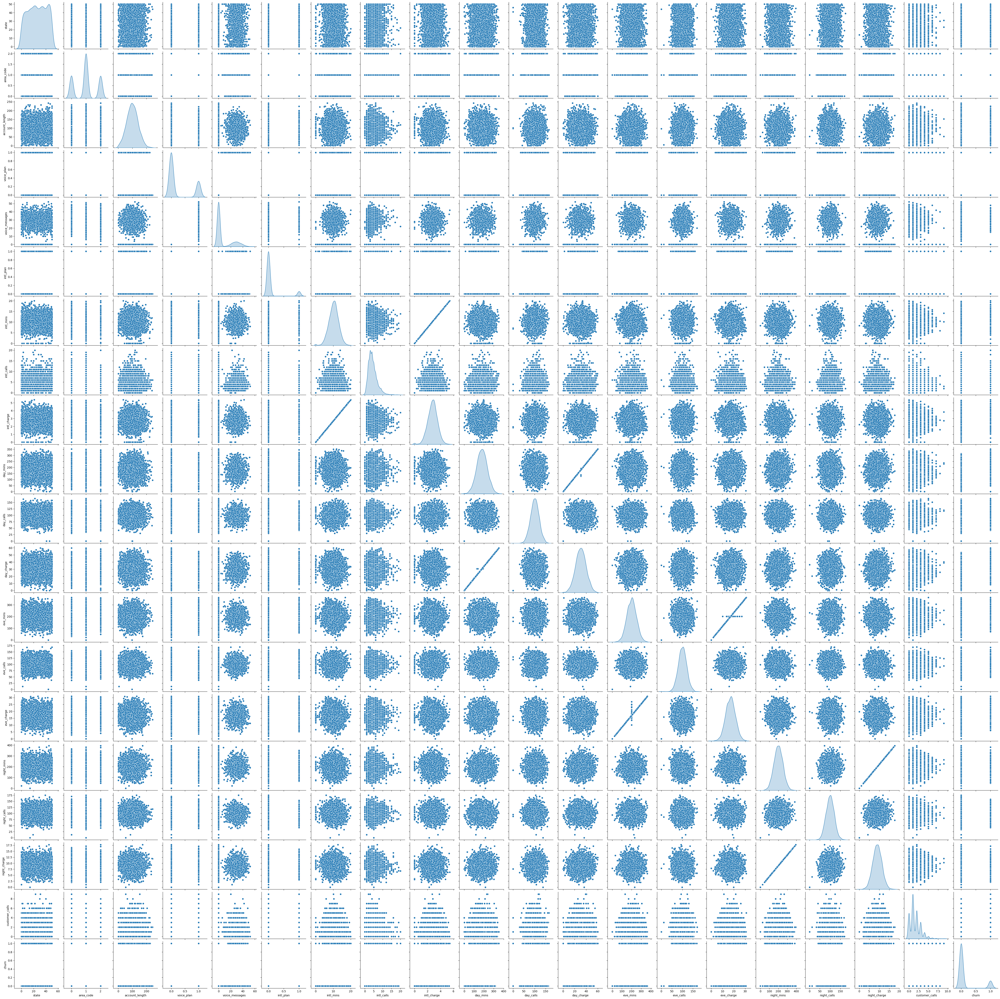

In [48]:
# Pair Plot
sns.pairplot(Telecom_churn_data1, diag_kind='kde')
plt.show()

# Heat Map

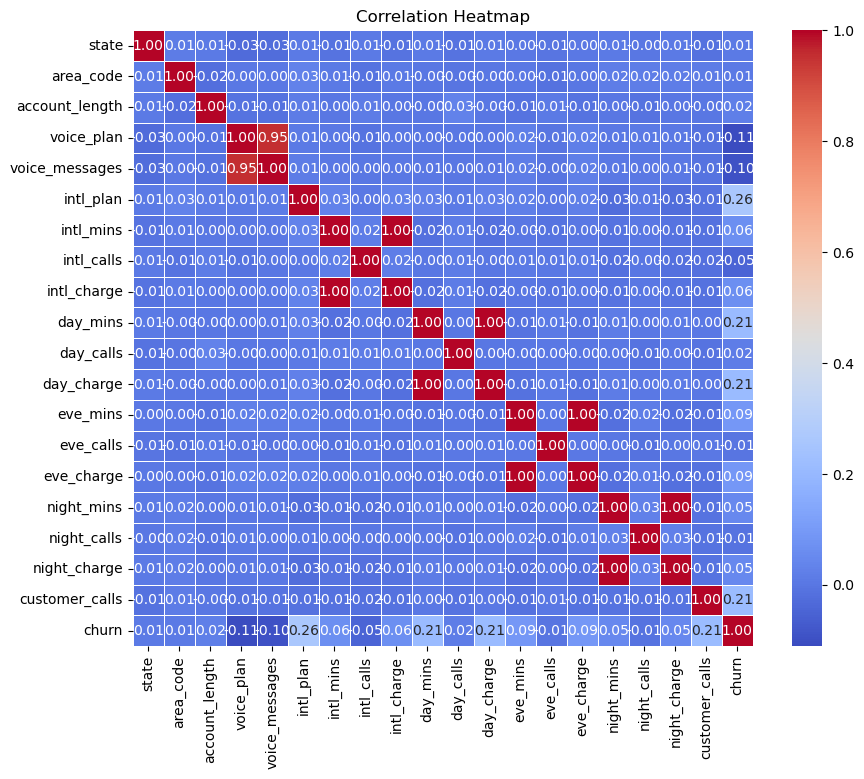

In [49]:

# Compute the correlation matrix
correlation_matrix = Telecom_churn_data1.corr()

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


# Dealing with Outliers

# Isolation Forest

In [50]:
Telecom_churn_data1.head(5)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,16,1,128,1,25,0,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,35,1,107,1,26,0,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
2,31,1,137,0,0,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
3,35,0,84,0,0,1,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,0
4,36,1,75,0,0,1,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,0


In [51]:
# training the model
clf = IsolationForest(random_state=10,contamination=.01)
clf.fit(Telecom_churn_data1)

IsolationForest(contamination=0.01, random_state=10)

In [52]:
# predictions
y_pred = clf.predict(Telecom_churn_data1)

y_pred

array([1, 1, 1, ..., 1, 1, 1])

In [53]:
Telecom_churn_data1.loc[y_pred==-1]

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
15,34,1,161,0,0,0,5.4,9,1.46,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,4,1
41,20,0,135,1,41,1,14.6,15,3.94,173.1,85,29.43,203.9,107,17.33,122.2,78,5.50,0,1
57,5,0,121,1,30,0,5.8,3,1.57,198.4,129,33.73,75.3,77,6.40,181.2,77,8.15,3,1
115,21,2,36,1,42,1,20.0,6,5.40,196.8,89,33.46,254.9,122,21.67,138.3,126,6.22,0,1
198,21,2,131,1,26,1,13.8,7,3.73,292.9,101,49.79,199.7,97,16.97,255.3,127,11.49,4,1
214,9,2,70,0,0,1,17.6,4,4.75,226.7,98,38.54,228.1,115,19.39,73.2,93,3.29,2,1
315,19,0,39,0,0,0,12.4,3,3.35,60.4,158,10.27,306.2,120,26.03,123.9,46,5.58,1,0
343,15,0,98,1,21,0,0.0,0,0.00,64.6,98,10.98,176.1,86,14.97,244.8,84,11.02,2,0
360,5,0,159,0,0,1,8.8,6,2.38,257.1,53,43.71,312.2,127,26.54,183.0,82,8.24,1,1
372,4,1,151,0,0,1,12.4,1,3.35,218.0,57,37.06,114.4,88,9.72,269.2,95,12.11,0,1


In [54]:
Telecom_churn_data1['scores']=clf.decision_function(Telecom_churn_data1)

In [55]:
Telecom_churn_data1.shape

(5000, 21)

In [56]:
Telecom_churn_data1['anomaly']=clf.predict(Telecom_churn_data1.iloc[:,0:20])

In [57]:
Telecom_churn_data1

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,...,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn,scores,anomaly
0,16,1,128,1,25,0,10.0,3,2.70,265.1,...,197.4,99,16.78,244.7,91,11.01,1,0,0.137328,1
1,35,1,107,1,26,0,13.7,3,3.70,161.6,...,195.5,103,16.62,254.4,103,11.45,1,0,0.141089,1
2,31,1,137,0,0,0,12.2,5,3.29,243.4,...,121.2,110,10.30,162.6,104,7.32,0,0,0.141898,1
3,35,0,84,0,0,1,6.6,7,1.78,299.4,...,61.9,88,5.26,196.9,89,8.86,2,0,0.029086,1
4,36,1,75,0,0,1,10.1,3,2.73,166.7,...,148.3,122,12.61,186.9,121,8.41,3,0,0.098065,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11,0,50,1,40,0,9.9,5,2.67,235.7,...,223.0,126,18.96,297.5,116,13.39,2,0,0.061858,1
4996,49,1,152,0,0,0,14.7,2,3.97,184.2,...,256.8,73,21.83,213.6,113,9.61,3,1,0.092240,1
4997,7,1,61,0,0,0,13.6,4,3.67,140.6,...,172.8,128,14.69,212.4,97,9.56,1,0,0.158253,1
4998,7,2,109,0,0,0,8.5,6,2.30,188.8,...,171.7,92,14.59,224.4,89,10.10,0,0,0.139986,1


In [58]:
#Print the outlier data points
Telecom_churn_data1[Telecom_churn_data1['anomaly']==-1]

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,...,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn,scores,anomaly
15,34,1,161,0,0,0,5.4,9,1.46,332.9,...,317.8,97,27.01,160.6,128,7.23,4,1,-0.013735,-1
41,20,0,135,1,41,1,14.6,15,3.94,173.1,...,203.9,107,17.33,122.2,78,5.50,0,1,-0.043964,-1
57,5,0,121,1,30,0,5.8,3,1.57,198.4,...,75.3,77,6.40,181.2,77,8.15,3,1,-0.007174,-1
115,21,2,36,1,42,1,20.0,6,5.40,196.8,...,254.9,122,21.67,138.3,126,6.22,0,1,-0.065555,-1
198,21,2,131,1,26,1,13.8,7,3.73,292.9,...,199.7,97,16.97,255.3,127,11.49,4,1,-0.004643,-1
214,9,2,70,0,0,1,17.6,4,4.75,226.7,...,228.1,115,19.39,73.2,93,3.29,2,1,-0.016106,-1
315,19,0,39,0,0,0,12.4,3,3.35,60.4,...,306.2,120,26.03,123.9,46,5.58,1,0,-0.008611,-1
343,15,0,98,1,21,0,0.0,0,0.00,64.6,...,176.1,86,14.97,244.8,84,11.02,2,0,-0.013019,-1
360,5,0,159,0,0,1,8.8,6,2.38,257.1,...,312.2,127,26.54,183.0,82,8.24,1,1,-0.038947,-1
372,4,1,151,0,0,1,12.4,1,3.35,218.0,...,114.4,88,9.72,269.2,95,12.11,0,1,-0.000890,-1


In [59]:
# Drop rows where 'anomaly' column is -1
Telecom_churn_data2 = Telecom_churn_data1[Telecom_churn_data1['anomaly'] != -1].copy()

# Print the cleaned DataFrame
print(Telecom_churn_data2)


      state  area_code  account_length  voice_plan  voice_messages  intl_plan  \
0        16          1             128           1              25          0   
1        35          1             107           1              26          0   
2        31          1             137           0               0          0   
3        35          0              84           0               0          1   
4        36          1              75           0               0          1   
...     ...        ...             ...         ...             ...        ...   
4995     11          0              50           1              40          0   
4996     49          1             152           0               0          0   
4997      7          1              61           0               0          0   
4998      7          2             109           0               0          0   
4999     46          1              86           1              34          0   

      intl_mins  intl_calls

In [60]:
Telecom_churn_data2.shape

(4950, 22)

In [61]:
Telecom_churn_data2.drop(columns=['scores', 'anomaly'], inplace=True)

In [62]:

Telecom_churn_data2.isnull().sum()

state             0
area_code         0
account_length    0
voice_plan        0
voice_messages    0
intl_plan         0
intl_mins         0
intl_calls        0
intl_charge       0
day_mins          0
day_calls         0
day_charge        0
eve_mins          0
eve_calls         0
eve_charge        0
night_mins        0
night_calls       0
night_charge      0
customer_calls    0
churn             0
dtype: int64

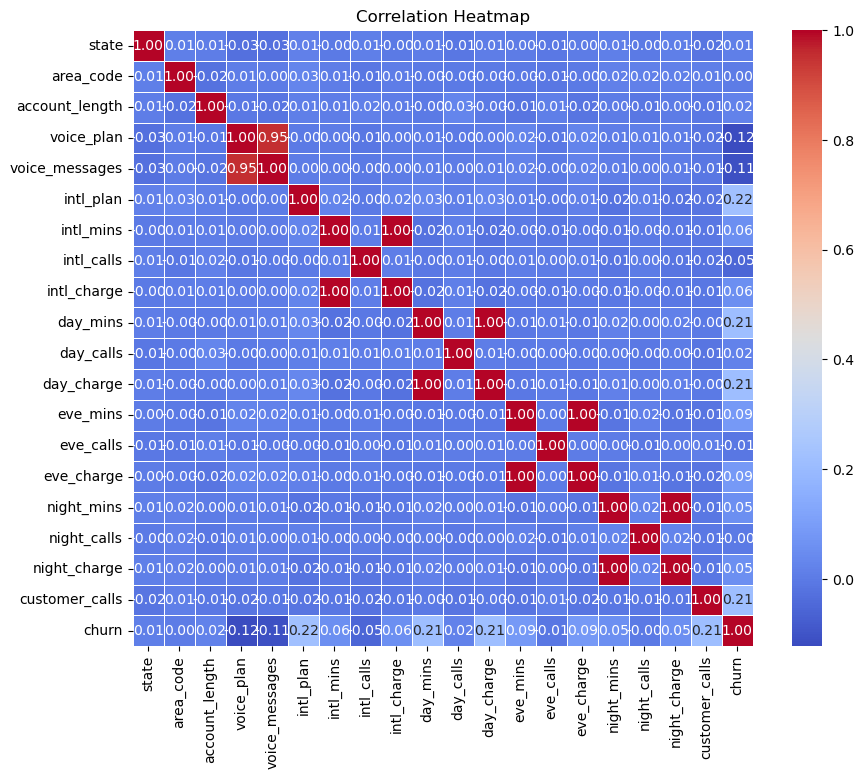

In [63]:

# Compute the correlation matrix
correlation_matrix = Telecom_churn_data2.corr()

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [64]:
Telecom_churn_data2.isnull().shape

(4950, 20)

# Data Standardization

In [65]:


# Separate features (X) and target variable (Y)
X = Telecom_churn_data2.drop('churn', axis=1)
Y = Telecom_churn_data2['churn']

# Ensure X and Y have the same number of rows
X = X[:Y.shape[0]]

# Standardize features in X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Create a DataFrame with the standardized features
Telecom_churn_data2_scaled = pd.DataFrame(X_scaled, columns=X.columns)

# Add the target variable 'churn' to the DataFrame
Telecom_churn_data2_scaled['churn'] = Y.values

# Now Telecom_churn_data2_scaled contains the standardized features and the target variable


In [66]:
Telecom_churn_data2_scaled.head(2)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,-0.678099,0.004574,0.701394,1.676491,1.284573,-0.310396,-0.094326,-0.586407,-0.095034,1.581267,0.503865,1.581500,-0.058475,-0.058844,-0.059244,0.877772,-0.451206,0.877058,-0.437313,0
1,0.606319,0.004574,0.171564,1.676491,1.358735,-0.310396,1.258836,-0.586407,1.259585,-0.351428,1.161572,-0.352215,-0.096490,0.143117,-0.096815,1.070509,0.152176,1.071340,-0.437313,0


In [67]:
Telecom_churn_data2_scaled.shape

(4950, 20)

In [68]:
Telecom_churn_data2_scaled.isnull().sum()

state             0
area_code         0
account_length    0
voice_plan        0
voice_messages    0
intl_plan         0
intl_mins         0
intl_calls        0
intl_charge       0
day_mins          0
day_calls         0
day_charge        0
eve_mins          0
eve_calls         0
eve_charge        0
night_mins        0
night_calls       0
night_charge      0
customer_calls    0
churn             0
dtype: int64

In [69]:
Y.shape

(4950,)

# Feature Engineering

# Feature Importance using Decision Tree

In [70]:

# Drop the target variable 'Churn' from the features
X = Telecom_churn_data2_scaled.drop('churn', axis=1)

# Extract the target variable 'Churn'
Y = Telecom_churn_data2_scaled['churn']

# Feature extraction using Extra Trees Classifier
model = ExtraTreesClassifier()
model.fit(X, Y)

# Printing feature importances
print(model.feature_importances_)


[0.0326716  0.02226691 0.03307647 0.01934236 0.0165444  0.05701025
 0.04366208 0.04966349 0.04231689 0.13709376 0.03396038 0.12961383
 0.05816072 0.03314084 0.05556938 0.03980328 0.03192791 0.03927519
 0.12490026]


Top 7 Features 

1.day_mins
2.day_charge
3.customer_calls
4.eve_mins
5.eve_charge
6..intl_calls
7.intl_plan
8.intl_mins

In [71]:
Telecom_churn_data2_scaled.head(2)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,-0.678099,0.004574,0.701394,1.676491,1.284573,-0.310396,-0.094326,-0.586407,-0.095034,1.581267,0.503865,1.581500,-0.058475,-0.058844,-0.059244,0.877772,-0.451206,0.877058,-0.437313,0
1,0.606319,0.004574,0.171564,1.676491,1.358735,-0.310396,1.258836,-0.586407,1.259585,-0.351428,1.161572,-0.352215,-0.096490,0.143117,-0.096815,1.070509,0.152176,1.071340,-0.437313,0


# Recursive Feature Elimination

In [203]:

# Drop the target variable 'Churn' from the features
X = Telecom_churn_data2_scaled.drop('churn', axis=1)

# Extract the target variable 'Churn'
Y = Telecom_churn_data2_scaled['churn']

# feature extraction
model = LogisticRegression(max_iter=400)

In [204]:
rfe = RFE(model, n_features_to_select=8, step=1)
fit = rfe.fit(X, Y)

In [205]:
#Num Features: 
fit.n_features_

8

In [206]:
#Selected Features:
fit.support_

array([False, False, False,  True,  True,  True, False, False,  True,
        True, False,  True, False, False,  True, False, False, False,
        True])

In [207]:
# Feature Ranking:
fit.ranking_

array([10, 12,  6,  1,  1,  1,  5,  3,  1,  1,  7,  1,  8,  9,  1,  2, 11,
        4,  1])

In [208]:
Telecom_churn_data2.head()

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,16,1,128,1,25,0,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,35,1,107,1,26,0,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
2,31,1,137,0,0,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
3,35,0,84,0,0,1,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,0
4,36,1,75,0,0,1,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,0


top 7. columns are 
1.voice_plan 2.voice_messages 3. intl_plan 4.intl_charge 5.day_mins 6.day_charge 7.eve_charge 8. customer_calls

In [210]:
# Selecting the desired columns
selected_columns = [
    'voice_plan', 'voice_messages', 'intl_plan','intl_charge','intl_mins', 'day_mins', 'day_charge',
    'eve_charge', 'customer_calls', 'eve_mins', 'intl_calls','churn']

# Creating a new DataFrame with the selected columns
Telecom_churn_data3 = Telecom_churn_data2_scaled[selected_columns]


In [212]:
Telecom_churn_data3.head(2)

,voice_plan,voice_messages,intl_plan,intl_charge,intl_mins,day_mins,day_charge,eve_charge,customer_calls,eve_mins,intl_calls,churn
0,1.676491,1.284573,-0.310396,-0.095034,-0.094326,1.581267,1.581500,-0.059244,-0.437313,-0.058475,-0.586407,0
1,1.676491,1.358735,-0.310396,1.259585,1.258836,-0.351428,-0.352215,-0.096815,-0.437313,-0.096490,-0.586407,0


In [213]:
Telecom_churn_data3.isnull().sum()

voice_plan        0
voice_messages    0
intl_plan         0
intl_charge       0
intl_mins         0
day_mins          0
day_charge        0
eve_charge        0
customer_calls    0
eve_mins          0
intl_calls        0
churn             0
dtype: int64

# Model Validation Method

# Train test split method

In [214]:


# Drop the target variable 'Churn' from the features
X = Telecom_churn_data3.drop('churn', axis=1)

# Extract the target variable 'Churn'
Y = Telecom_churn_data3['churn']

test_size = 0.25
seed = 5
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)

model = LogisticRegression(max_iter=500)
model.fit(X_train, Y_train)


result = model.score(X_test, Y_test)

result*100.0

88.61066235864298

# K fold Cross Validation

In [215]:


# Drop the target variable 'Churn' from the features
X = Telecom_churn_data3.drop('churn', axis=1)

# Extract the target variable 'Churn'
Y = Telecom_churn_data3['churn']

kf = KFold(n_splits=10)

mod = [LogisticRegression(), KNeighborsClassifier(), DecisionTreeClassifier(), RandomForestClassifier(), SVC()]

for i in range(len(mod)):
    kf_scores = cross_val_score(mod[i],X,Y,cv=kf)
    print('Creating Model With ' + str(mod[i]))
    print('Testing Accuracy of are Model is : ' + str(kf_scores.mean()))
    print('Printing All Training Model Accuracy : \n' + str(kf_scores))
    print('\n')

Creating Model With LogisticRegression()
Testing Accuracy of are Model is : 0.8698989898989898
Printing All Training Model Accuracy : 
[0.87474747 0.9010101  0.87070707 0.85454545 0.86868687 0.83232323
 0.87474747 0.88282828 0.85252525 0.88686869]


Creating Model With KNeighborsClassifier()
Testing Accuracy of are Model is : 0.9173737373737374
Printing All Training Model Accuracy : 
[0.92121212 0.92525253 0.92727273 0.9010101  0.91717172 0.90707071
 0.92323232 0.91313131 0.90707071 0.93131313]


Creating Model With DecisionTreeClassifier()
Testing Accuracy of are Model is : 0.9216161616161616
Printing All Training Model Accuracy : 
[0.91515152 0.92323232 0.91717172 0.92121212 0.93333333 0.90505051
 0.93333333 0.90505051 0.91717172 0.94545455]


Creating Model With RandomForestClassifier()
Testing Accuracy of are Model is : 0.9521212121212121
Printing All Training Model Accuracy : 
[0.95151515 0.94747475 0.95151515 0.94545455 0.95555556 0.94343434
 0.95959596 0.94141414 0.94141414 0.98

# Model Building

# Importing Packages

In [216]:
Telecom_churn_data3.head(2)

,voice_plan,voice_messages,intl_plan,intl_charge,intl_mins,day_mins,day_charge,eve_charge,customer_calls,eve_mins,intl_calls,churn
0,1.676491,1.284573,-0.310396,-0.095034,-0.094326,1.581267,1.581500,-0.059244,-0.437313,-0.058475,-0.586407,0
1,1.676491,1.358735,-0.310396,1.259585,1.258836,-0.351428,-0.352215,-0.096815,-0.437313,-0.096490,-0.586407,0


# LogisticRegression

In [217]:
# Drop the target variable 'Churn' from the features
X = Telecom_churn_data3.drop('churn', axis=1)

# Extract the target variable 'Churn'
Y = Telecom_churn_data3['churn']

In [218]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [219]:
# Initialize the Logistic Regression model
model = LogisticRegression()

# Train the model on the training data
model.fit(X_train, y_train)

LogisticRegression()

In [220]:
Telecom_churn_data3.head(5)

,voice_plan,voice_messages,intl_plan,intl_charge,intl_mins,day_mins,day_charge,eve_charge,customer_calls,eve_mins,intl_calls,churn
0,1.676491,1.284573,-0.310396,-0.095034,-0.094326,1.581267,1.581500,-0.059244,-0.437313,-0.058475,-0.586407,0
1,1.676491,1.358735,-0.310396,1.259585,1.258836,-0.351428,-0.352215,-0.096815,-0.437313,-0.096490,-0.586407,0
2,-0.596484,-0.569495,-0.310396,0.704191,0.710257,1.176054,1.176079,-1.580874,-1.208766,-1.583072,0.234264,0
3,-0.596484,-0.569495,3.221694,-1.341284,-1.337772,2.221764,2.222042,-2.764364,0.334141,-2.769536,1.054936,0
4,-0.596484,-0.569495,3.221694,-0.054395,-0.057754,-0.256193,-0.256628,-1.038441,1.105594,-1.040860,-0.586407,0


In [221]:
# Predict on the testing data
y_pred = model.predict(X_test)
y_pred

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [222]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8717171717171717


In [223]:
# Display classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       860
           1       0.54      0.16      0.25       130

    accuracy                           0.87       990
   macro avg       0.71      0.57      0.59       990
weighted avg       0.84      0.87      0.84       990



In [224]:

# Make predictions on test data
y_pred_prob = model.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)




In [225]:

# Calculate AUC score
auc_score = roc_auc_score(y_test, y_pred_prob)

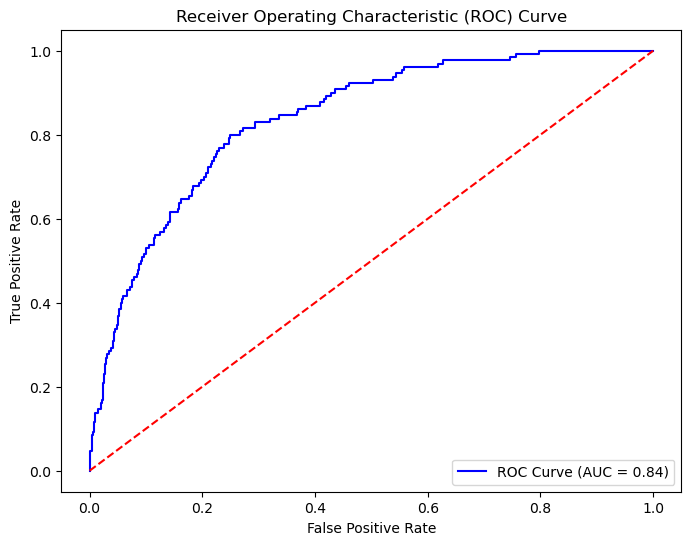

In [226]:
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {auc_score:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# K-Nearest Neighbour

In [227]:
# Define the parameter grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9],       # Number of neighbors to use
    'weights': ['uniform', 'distance'],# Weight function used in prediction
    'p': [1, 2]                         # Power parameter for the Minkowski metric
}

In [228]:
# Instantiate the KNN classifier
knn_classifier = KNeighborsClassifier()

In [229]:
# Instantiate GridSearchCV
grid_search = GridSearchCV(knn_classifier, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [3, 5, 7, 9], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [230]:
# Get the best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

Best Parameters: {'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}


In [231]:
# Get the best estimator
best_estimator = grid_search.best_estimator_

In [232]:
# Use the best estimator to make predictions
y_pred = best_estimator.predict(X_test)

In [233]:
# Print classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95       860
           1       0.85      0.46      0.60       130

    accuracy                           0.92       990
   macro avg       0.88      0.72      0.78       990
weighted avg       0.91      0.92      0.91       990



# Support Vector Machine

In [234]:

# Initialize the SVM model
svm_model = SVC(kernel='rbf')

# Train the SVM model on the training data
svm_model.fit(X_train, y_train)

# Predict on the testing data
y_pred = svm_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Display classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 0.9313131313131313
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       860
           1       0.84      0.58      0.69       130

    accuracy                           0.93       990
   macro avg       0.89      0.78      0.83       990
weighted avg       0.93      0.93      0.93       990



In [235]:

# Initialize the SVM model
svm_model1 = SVC(kernel='linear')

# Train the SVM model on the training data
svm_model1.fit(X_train, y_train)

# Predict on the testing data
y_pred = svm_model1.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Display classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 0.8686868686868687
Classification Report:
              precision    recall  f1-score   support

           0       0.87      1.00      0.93       860
           1       0.00      0.00      0.00       130

    accuracy                           0.87       990
   macro avg       0.43      0.50      0.46       990
weighted avg       0.75      0.87      0.81       990



In [236]:
# Initialize the SVM model
svm_model2 = SVC(kernel='poly')

# Train the SVM model on the training data
svm_model2.fit(X_train, y_train)

# Predict on the testing data
y_pred = svm_model2.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Display classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.9343434343434344
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       860
           1       0.84      0.62      0.71       130

    accuracy                           0.93       990
   macro avg       0.89      0.80      0.84       990
weighted avg       0.93      0.93      0.93       990



In [237]:
# Initialize the SVM model
svm_model3 = SVC(kernel='sigmoid')

# Train the SVM model on the training data
svm_model3.fit(X_train, y_train)

# Predict on the testing data
y_pred = svm_model3.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Display classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.7888888888888889
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.89      0.88       860
           1       0.14      0.12      0.13       130

    accuracy                           0.79       990
   macro avg       0.50      0.50      0.50       990
weighted avg       0.77      0.79      0.78       990



# Naive Bayes 

In [239]:
# Instantiate the Naive Bayes classifier
naive_bayes_classifier = GaussianNB()

# Train the classifier on the training data
naive_bayes_classifier.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = naive_bayes_classifier.predict(X_test)

# Evaluate the model
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       860
           1       0.53      0.52      0.53       130

    accuracy                           0.88       990
   macro avg       0.73      0.73      0.73       990
weighted avg       0.88      0.88      0.88       990



# Decision Tree Model

In [240]:

# Define the parameter grid
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Instantiate the decision tree classifier
dt_classifier = DecisionTreeClassifier(criterion='entropy')

# Instantiate GridSearchCV
grid_search = GridSearchCV(dt_classifier, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Get the best estimator
best_estimator = grid_search.best_estimator_

# Use the best estimator to make predictions
y_pred = best_estimator.predict(X_test)

# Print classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


Best Parameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       860
           1       0.86      0.74      0.79       130

    accuracy                           0.95       990
   macro avg       0.91      0.86      0.88       990
weighted avg       0.95      0.95      0.95       990



# Bagging Classifier

In [241]:
from sklearn.ensemble import BaggingClassifier

# Initialize the base classifier (e.g., Decision Tree)
base_classifier = DecisionTreeClassifier()

# Initialize the BaggingClassifier
bagging_classifier = BaggingClassifier(base_estimator=base_classifier, n_estimators=10, random_state = 42)

# Train the BaggingClassifier
bagging_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = bagging_classifier.predict(X_test)

# Generate classification report
report = classification_report(y_test, y_pred)

# Print classification report
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       860
           1       0.88      0.77      0.82       130

    accuracy                           0.96       990
   macro avg       0.93      0.88      0.90       990
weighted avg       0.96      0.96      0.96       990



# Random Forest

In [242]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the Random Forest classifier
rf_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_classifier.predict(X_test)

# Generate classification report
report = classification_report(y_test, y_pred)

# Print classification report
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       860
           1       0.89      0.78      0.83       130

    accuracy                           0.96       990
   macro avg       0.93      0.88      0.90       990
weighted avg       0.96      0.96      0.96       990



# Adaboost 

In [243]:
from sklearn.ensemble import AdaBoostClassifier

# Initialize the base classifier (e.g., Decision Tree)
base_classifier = DecisionTreeClassifier(max_depth=4)  # Stump (weak learner)

# Initialize the AdaBoost classifier
ada_classifier = AdaBoostClassifier(base_estimator=base_classifier, n_estimators=100, random_state=42)

# Train the AdaBoost classifier
ada_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = ada_classifier.predict(X_test)

# Generate classification report
report = classification_report(y_test, y_pred)

# Print classification report
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.97       860
           1       0.80      0.72      0.76       130

    accuracy                           0.94       990
   macro avg       0.88      0.85      0.86       990
weighted avg       0.94      0.94      0.94       990



# Voting Ensemble For Classification

In [244]:
# Voting Ensemble for Classification
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier


kfold = KFold(n_splits=10)

# create the sub models
estimators = []
model1 = LogisticRegression(max_iter=500)
estimators.append(('logistic', model1))
model2 = DecisionTreeClassifier()
estimators.append(('cart', model2))
model3 = SVC()
estimators.append(('svm', model3))
model4 = RandomForestClassifier()
estimators.append(('Random Forest', model4))

# create the ensemble model
ensemble = VotingClassifier(estimators)
results = cross_val_score(ensemble, X, Y, cv=kfold)
print(results.mean())

0.9351515151515152


# Comparing Algorithms

In [245]:
# Compare Algorithms
import pandas as pd
from matplotlib import pyplot
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

# Drop the target variable 'Churn' from the features
X = Telecom_churn_data3.drop('churn', axis=1)

# Extract the target variable 'Churn'
Y = Telecom_churn_data3['churn']

# prepare models
models = []
models.append(('LR', LogisticRegression(max_iter=400)))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('Random Forest', RandomForestClassifier()))
# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    kfold = KFold(n_splits=20)
    cv_results = cross_val_score(model, X, Y, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.870294 (0.024260)
KNN: 0.918783 (0.019894)
CART: 0.927072 (0.018441)
NB: 0.875957 (0.018762)
SVM: 0.932115 (0.015293)
Random Forest: 0.951113 (0.012451)


We can clearly Random forest will give more accuracy

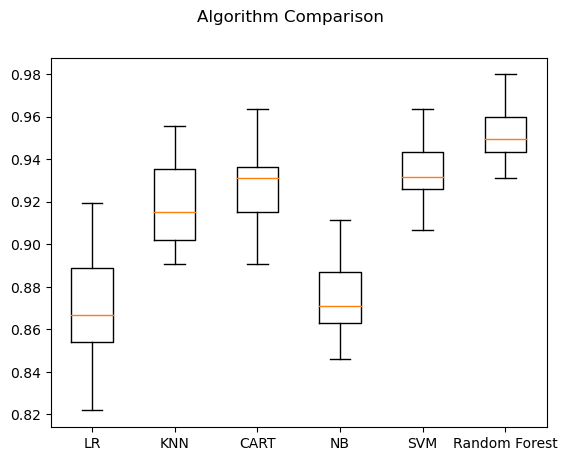

In [246]:
# boxplot algorithm comparison
fig = pyplot.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
pyplot.boxplot(results)
ax.set_xticklabels(names)
pyplot.show()

# ML Pipeline

In [247]:
# Create a pipeline that standardizes the data then creates a model
from pandas import read_csv
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

# Drop the target variable 'Churn' from the features
X = Telecom_churn_data3.drop('churn', axis=1)

# Extract the target variable 'Churn'
Y = Telecom_churn_data3['churn']

# create pipeline
estimators = []
estimators.append(('standardize', StandardScaler()))
estimators.append(('Random Forest', RandomForestClassifier(n_estimators=120, random_state=42)))
model = Pipeline(estimators)

# evaluate pipeline
kfold = KFold(n_splits=10)
results = cross_val_score(model, X, Y, cv=kfold)
print(results.mean())

0.9529292929292931


In [248]:
# Create a pipeline that extracts features from the data then creates a model
from pandas import read_csv
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest
# Drop the target variable 'Churn' from the features
X = Telecom_churn_data3.drop('churn', axis=1)

# Extract the target variable 'Churn'
Y = Telecom_churn_data3['churn']

# create feature union
features = []
features.append(('pca', PCA(n_components=11)))
features.append(('select_best', SelectKBest(k=6)))
feature_union = FeatureUnion(features)

# create pipeline
estimators = []
estimators.append(('feature_union', feature_union))
estimators.append(('Random Forest', RandomForestClassifier(n_estimators=120, random_state=42)))
model = Pipeline(estimators)
# evaluate pipeline
kfold = KFold(n_splits=10)
results = cross_val_score(model, X, Y, cv=kfold)
print(results.mean())


0.9424242424242424


# Saving Model

In [253]:
# Save Model Using Pickle and load and predict
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from pickle import dump
from pickle import load

# Drop the target variable 'churn' from the features
X = Telecom_churn_data3.drop('churn', axis=1)

# Extract the target variable 'churn'
Y = Telecom_churn_data3['churn']

# Split the data into training and testing sets with a fixed random state
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=42)

# Initialize and train the model
model = RandomForestClassifier(n_estimators=120, random_state=42)
model.fit(X_train, Y_train)

# Save the model to disk
filename = 'C:\\Users\\pavan\\Desktop\\Telecom-Churn-Project\\finalized_model.sav'

dump(model, open(filename, 'wb'))

# Load the model from disk
loaded_model = load(open(filename, 'rb'))

# Evaluate the model on the test set
result = loaded_model.score(X_test, Y_test)
print("Accuracy:", result)


Accuracy: 0.9585858585858585


In [254]:
Telecom_churn_data3.head(2)

,voice_plan,voice_messages,intl_plan,intl_charge,intl_mins,day_mins,day_charge,eve_charge,customer_calls,eve_mins,intl_calls,churn
0,1.676491,1.284573,-0.310396,-0.095034,-0.094326,1.581267,1.581500,-0.059244,-0.437313,-0.058475,-0.586407,0
1,1.676491,1.358735,-0.310396,1.259585,1.258836,-0.351428,-0.352215,-0.096815,-0.437313,-0.096490,-0.586407,0


In [255]:
Telecom_churn_data.head(2)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.7,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,OH,area_code_415,107,yes,26,no,13.7,3,3.7,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
